# Necessary imports

In [1]:
!pip install open_clip_torch transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 45.5 MB/s eta 0:00:00


In [17]:
from google.colab import drive, files
import os
import matplotlib.pyplot as plt
import shutil
from PIL import Image
from IPython.display import display
import open_clip
import torch
import pandas as pd

# Load data

In [3]:
drive.mount('/content/gdrive')
# Replace with link/path to dataset (I, my case, I uploaded the dataset on my Drive)
zip_file_path = "/content/gdrive/MyDrive/dataset/images_dataset.zip"
extracted_folder_path = '/content/dataset'
# Unzip the file using the command line
!unzip "$zip_file_path" -d "$extracted_folder_path"

Mounted at /content/gdrive
Archive:  /content/gdrive/MyDrive/dataset/images_dataset.zip
   creating: /content/dataset/images/
   creating: /content/dataset/images/data/
   creating: /content/dataset/images/data/bike/
  inflating: /content/dataset/images/data/bike/bike_001.bmp  
  inflating: /content/dataset/images/data/bike/bike_002.bmp  
  inflating: /content/dataset/images/data/bike/bike_003.bmp  
  inflating: /content/dataset/images/data/bike/bike_004.bmp  
  inflating: /content/dataset/images/data/bike/bike_005.bmp  
  inflating: /content/dataset/images/data/bike/bike_006.bmp  
  inflating: /content/dataset/images/data/bike/bike_007.bmp  
  inflating: /content/dataset/images/data/bike/bike_008.bmp  
  inflating: /content/dataset/images/data/bike/bike_009.bmp  
  inflating: /content/dataset/images/data/bike/bike_010.bmp  
  inflating: /content/dataset/images/data/bike/bike_011.bmp  
  inflating: /content/dataset/images/data/bike/bike_012.bmp  
  inflating: /content/dataset/images/da

In [4]:
folders_categories = extracted_folder_path + '/images/data'
def merge_folders(source_folder, destination_folder):
    # Create the destination folder if it doesn't exist
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    # Iterate through each file in the source folder
    for item in os.listdir(source_folder):
        source_item = os.path.join(source_folder, item)
        destination_item = os.path.join(destination_folder, item)

        # Copy each file inside the destination folder
        shutil.copy2(source_item, destination_item)

# Get path to the list of category folders
source_folders = []
for folder in os.listdir(folders_categories):
  source_folders.append(folders_categories + '/' + folder)

# Merge contents of multiple folders into a single folder
destination_folder = "/content/merged_dataset"
for source_folder in source_folders:
    merge_folders(source_folder, destination_folder)

# Load model

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model, _, transform = open_clip.create_model_and_transforms(
  model_name="coca_ViT-L-14",
  pretrained="mscoco_finetuned_laion2B-s13B-b90k"
)
model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_pytorch_model.bin:   0%|          | 0.00/2.55G [00:00<?, ?B/s]

CoCa(
  (text): TextTransformer(
    (token_embedding): Embedding(49408, 768)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_final): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (patch_drop

# Generate Dataframe with captions

In [7]:
def generate_caption(image_path):
    im = Image.open(image_path).convert("RGB")
    im = transform(im).unsqueeze(0)

    with torch.no_grad(), torch.cuda.amp.autocast():
        generated = model.generate(im.to(device))

    caption = open_clip.decode(generated[0]).split("<end_of_text>")[0].replace("<start_of_text>", "")

    return caption


# Get all images paths
image_files = [os.path.join(destination_folder, f) for f in os.listdir(destination_folder)]
# Create an empty DataFrame
df = pd.DataFrame(columns=["file_name", "caption"])

for image_path in image_files:
    caption = generate_caption(image_path)
    df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)

/content/merged_dataset/horse-16.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_202.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-63.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_367.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.102.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.89.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_284.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.93.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-8.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0030.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_083.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_316.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0024.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_106.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.185.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_046.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_176.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0171.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_244.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.47.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_149.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-189.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-194.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_294.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_204.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_017.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0049.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0007.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.41.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.88.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0129.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-140.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-120.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.116.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_347.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0047.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-156.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-88.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_024.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_070.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_322.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_105.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-12.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_358.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_007.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-15.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-58.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0189.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.94.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.138.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_194.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_223.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-180.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-177.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.106.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.92.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0114.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.116.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_277.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0137.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.32.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_339.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_035.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_278.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_345.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_283.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_029.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.37.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-178.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.126.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-78.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_165.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0052.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_353.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-10.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-111.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_055.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.109.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_363.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_159.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_239.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0179.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.110.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.95.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_288.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_240.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.178.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.46.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0123.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-63.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_219.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.192.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_342.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-129.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0093.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.63.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_256.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.200.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0078.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.195.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_008.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_150.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_270.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_019.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-135.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.25.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.91.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.194.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_076.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.13.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-18.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_160.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_063.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-154.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0053.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0043.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_373.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_069.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0062.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_325.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-61.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.161.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_047.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0140.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-164.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_120.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.17.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.31.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.119.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_264.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.70.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0009.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.86.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_113.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_159.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_385.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-126.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.125.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_343.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_057.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0106.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-170.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_013.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-78.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_212.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.132.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.7.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_420.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_180.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_321.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-37.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.118.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0148.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-202.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.106.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.147.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_217.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-128.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0166.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0141.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_092.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.69.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_382.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-187.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0183.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_118.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0032.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_320.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_035.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_322.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_260.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-32.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0139.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_310.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.198.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.56.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-136.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_089.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_354.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-152.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_110.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_362.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_096.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.142.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_136.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_271.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_289.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.83.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-174.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-175.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0178.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_029.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.90.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.183.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_168.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-52.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_360.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0081.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_401.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_216.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_112.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-18.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.82.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0120.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0210.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-109.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_320.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_330.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0188.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_375.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0082.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-150.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_247.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_099.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0028.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-132.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-24.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_316.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_309.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_311.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-116.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-151.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_244.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.87.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_030.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_337.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-1.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.66.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_361.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_351.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-30.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_331.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.108.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_301.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_149.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.30.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_259.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_116.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0176.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_319.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_012.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-23.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-42.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_020.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_138.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_051.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_268.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-148.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_013.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_276.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_052.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.4.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.68.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-156.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0014.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-10.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.2.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-120.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_212.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.70.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-158.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-179.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-164.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.192.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_082.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_178.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-90.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.118.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0181.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-183.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_326.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_072.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-143.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.68.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.38.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_259.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_097.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-65.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-190.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-135.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-13.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-13.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_372.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-55.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_302.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-65.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_126.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0025.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_067.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-177.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.148.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_022.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-134.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.201.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_236.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_100.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.153.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_032.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_063.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-146.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-106.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-139.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.89.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.9.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.201.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_061.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.85.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_405.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0008.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-8.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.163.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-138.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-57.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0019.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_123.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.55.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-147.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-1.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_040.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_329.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_328.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_039.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_065.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_133.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-141.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0187.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_183.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-49.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_215.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0050.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_269.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-165.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_157.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-56.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_179.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_352.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_088.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-118.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0005.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.11.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-121.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_304.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-137.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.19.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-73.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.130.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.122.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_034.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_027.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-144.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0133.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_140.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0147.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0094.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-58.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-85.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-98.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-99.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_253.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_048.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.67.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_203.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_280.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-193.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.181.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_108.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_402.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_070.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-90.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.160.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-110.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-152.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.57.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-20.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_394.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_009.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.52.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_220.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-197.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0097.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_186.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_144.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_061.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0116.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.95.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0003.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_412.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-80.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-21.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_087.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_164.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_170.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-75.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_317.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_045.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0192.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.30.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-172.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-199.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_120.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_117.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_293.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-73.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_053.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-48.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.150.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_129.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_287.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_392.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_357.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.49.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_235.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.25.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_381.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_175.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_346.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.100.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0206.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-3.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0112.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_351.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0042.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.184.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_015.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_165.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_166.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.151.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_175.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-86.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.62.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.175.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-197.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.112.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_087.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_247.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.117.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_403.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-83.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_086.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-52.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.178.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0017.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_348.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_307.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-172.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_076.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-45.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_391.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0066.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_081.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.136.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-26.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.97.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.77.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_155.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_222.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_143.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.5.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-81.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.111.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-5.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-185.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_248.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.157.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-33.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-122.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_184.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-194.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_378.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.13.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_078.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.42.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_296.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_314.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_077.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.79.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.165.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-50.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0153.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_283.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-22.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-168.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0151.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_114.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_199.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-54.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_357.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_147.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_370.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0127.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-62.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0076.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_289.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.124.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0197.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_142.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.177.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-123.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_299.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.166.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_380.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_265.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0156.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_328.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_071.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_102.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_152.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_387.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-39.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-176.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-114.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_160.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_055.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_291.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_235.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_131.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-80.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_279.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-35.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_312.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_033.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.100.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_396.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0162.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.8.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.193.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_281.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-42.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.91.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-91.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_278.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-74.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.24.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.53.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_245.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-173.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-71.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_410.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_418.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0143.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_227.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_154.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0174.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_356.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_137.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.42.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-151.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-60.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.133.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-173.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.107.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0020.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_093.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_414.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.115.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_104.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_064.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_341.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-195.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-136.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.103.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_356.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-117.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_214.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_239.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.17.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_243.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-32.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_258.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_232.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0205.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.79.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.129.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_080.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0177.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_315.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.40.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.122.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-29.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.15.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_058.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0021.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_263.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.137.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-68.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_338.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0029.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_025.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_262.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-51.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0161.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_344.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_355.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_198.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_198.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-95.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-92.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.160.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.65.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0088.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0056.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_255.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0075.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.73.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_177.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_303.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.44.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-100.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_337.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-117.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_127.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_353.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-165.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_011.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.139.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_008.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-4.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.186.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_009.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.18.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.78.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_400.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.59.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_205.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_188.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_182.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.143.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_409.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0134.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_182.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.194.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-44.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.156.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_151.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.164.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-40.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.156.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.193.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-53.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-123.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-25.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0154.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.83.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_228.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_060.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0086.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_186.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_091.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.182.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_294.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-157.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-103.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_317.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-124.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_209.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-35.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-37.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0121.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.53.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_333.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-198.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.197.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_193.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_106.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_224.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.37.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-174.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_202.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-134.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0142.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-132.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-94.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.32.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_176.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0158.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0061.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_172.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_310.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0202.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_101.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0074.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_112.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-71.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_270.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_089.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.127.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-110.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-114.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-183.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_085.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_196.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0117.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.103.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_225.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_072.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-82.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_053.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0068.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_100.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0204.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.171.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.176.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.60.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0150.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.167.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.159.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-125.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.152.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_298.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_331.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_084.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.76.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-115.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.144.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_010.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_417.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_282.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_174.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-92.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-147.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_386.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_074.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-162.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0184.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.200.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.140.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_139.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0040.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_285.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_190.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-146.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_366.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_225.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0096.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_194.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_306.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_255.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_303.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_258.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.61.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-196.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_236.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_323.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_415.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-200.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_326.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0128.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-137.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-96.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_359.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-155.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-161.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_010.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_251.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.99.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.58.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0103.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_023.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_285.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_049.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_217.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-70.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-30.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0067.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-163.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_121.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_185.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-28.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_086.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_133.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.119.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_134.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_137.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.46.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_354.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_031.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.64.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_362.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-98.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_043.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0095.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-171.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_117.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.20.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.174.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.189.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0054.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-21.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0090.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-187.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0109.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0113.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-64.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_227.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.66.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-130.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_056.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_047.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_261.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_389.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_068.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_238.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-40.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_099.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_210.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_195.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0060.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_094.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-93.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-84.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-45.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.39.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.43.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.115.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0016.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0055.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_218.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0058.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0193.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_260.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0186.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_224.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_209.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_274.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0196.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-102.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_344.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_141.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_273.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0011.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-48.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_183.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_185.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_189.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0079.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.48.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.54.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_163.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.145.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-155.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_301.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_050.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-166.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_361.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_411.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_221.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-38.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.126.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_206.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_352.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.189.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.14.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-167.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.149.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.153.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_111.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0191.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_305.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.38.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_191.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_103.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.58.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-68.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_085.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_169.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_126.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-103.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_254.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_350.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0201.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.26.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_011.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_039.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_048.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.183.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_027.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_290.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_162.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_281.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0185.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-182.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_128.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-83.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-9.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_223.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_005.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-72.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.22.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_199.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_240.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.169.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.120.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_021.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_083.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-33.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_393.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.117.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-6.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_006.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_233.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0149.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.36.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0010.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_173.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_288.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-153.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.54.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.33.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_054.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.59.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_253.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-149.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_058.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.179.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_341.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-112.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.112.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.24.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.96.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-88.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.188.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.23.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0099.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0111.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_397.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.10.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_116.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-106.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_062.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-159.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0172.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0012.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_297.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_043.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.84.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-109.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-199.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_002.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-36.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0126.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_313.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-11.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_305.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-17.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.60.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.4.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.29.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-105.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.93.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_338.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-85.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_384.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.132.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_368.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-67.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0125.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_018.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_044.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-121.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.134.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_015.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_245.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.80.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0039.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.69.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_191.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_006.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.158.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0073.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.78.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-186.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.125.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_211.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.50.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_195.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.148.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.8.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-196.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0035.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-142.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.11.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0108.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_277.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_232.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_091.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.149.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_119.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0006.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-64.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0182.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_226.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.173.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_037.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_360.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_163.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-77.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_138.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.99.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.108.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-145.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_096.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.180.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.185.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-140.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.113.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0031.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_125.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-119.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-72.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_090.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0131.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_036.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_398.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_158.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-14.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_079.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.135.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_075.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_179.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-41.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.43.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.71.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_190.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.174.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_273.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.88.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_257.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_257.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_364.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.143.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-43.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_295.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_275.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-181.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0119.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_230.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.180.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.9.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0180.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_261.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-107.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_206.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0110.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-188.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.170.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.154.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_094.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-4.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_093.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-101.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-17.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.62.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_177.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-113.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-180.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_166.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-176.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.179.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_335.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-23.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0015.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.155.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-2.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-201.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_228.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_178.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-162.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.186.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_193.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-96.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.81.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.130.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.137.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.101.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_069.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_001.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-163.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0164.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.27.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0207.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_051.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.52.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_286.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_364.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_238.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_146.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_290.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_302.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_340.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.45.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.139.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_140.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-59.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0107.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_266.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_262.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_088.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.94.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.1.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_300.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_323.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_001.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_324.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-84.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_339.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_342.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_032.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.171.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_197.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_097.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_335.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.23.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0100.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_025.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-3.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_095.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_073.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0004.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-108.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-74.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_416.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_102.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_129.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.12.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_095.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.75.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-181.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_033.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0037.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-57.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_207.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_197.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0080.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-91.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.72.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.29.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.26.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_246.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_122.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_056.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_077.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-186.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_318.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_157.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.36.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-53.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_016.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_269.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-56.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_108.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_023.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.20.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-130.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_263.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_308.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-188.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_256.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-9.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.150.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0001.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_064.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0038.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-131.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_135.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.166.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_218.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.123.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_141.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_092.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_024.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_082.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_334.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0170.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.190.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-7.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_104.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-31.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0013.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_071.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_161.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.71.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-59.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_038.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_131.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0087.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_130.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0089.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.48.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_254.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_041.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_115.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_180.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.142.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.121.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_250.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0115.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.107.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0104.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_075.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_049.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_350.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_220.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_014.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.101.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_318.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_066.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-60.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_005.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_059.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-87.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0048.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.152.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0063.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.134.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_231.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_272.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_349.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_371.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_113.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_188.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.31.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_297.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.129.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_215.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_208.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_004.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0160.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_118.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_153.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_252.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0135.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-193.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_122.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-127.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.82.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-29.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_127.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_346.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.154.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_121.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_068.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-111.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_241.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-144.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.56.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_004.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0069.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.10.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.105.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.72.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_196.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_345.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_125.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0159.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_234.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.191.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_026.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0130.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-15.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.22.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.175.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_390.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.40.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0102.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0084.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0124.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.98.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.110.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_241.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.168.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.159.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_325.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-153.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-12.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_080.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-198.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.75.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_014.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_266.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-47.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_219.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.61.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-175.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0034.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_101.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.21.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_230.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-119.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_347.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-70.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-101.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_293.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-81.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.81.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_291.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_329.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_003.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.187.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_222.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_111.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0105.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_286.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.80.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_229.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-19.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_419.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-150.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_234.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_046.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.96.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0033.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_143.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-195.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0194.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_153.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0083.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-141.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-26.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0152.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-93.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_142.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_170.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_145.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.144.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0200.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_374.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.67.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0209.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-49.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_135.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0136.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_207.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-100.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-178.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-44.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_406.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.16.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_311.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-170.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-86.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-107.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.74.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_208.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_181.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-20.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_330.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_299.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_155.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0157.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_268.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.196.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-131.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.86.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.97.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-182.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-67.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_040.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0144.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_022.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.28.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0046.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-145.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-161.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-76.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.141.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.98.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.190.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-11.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_158.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-133.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_333.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0169.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_171.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.90.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.184.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_201.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_038.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_251.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_237.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_200.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_084.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-192.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.123.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.128.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.44.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.167.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_034.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.188.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.47.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_105.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.102.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.136.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-31.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.169.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-82.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_124.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-14.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-108.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_145.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_267.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0057.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-99.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.74.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_045.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-61.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0167.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_304.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_042.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.34.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_203.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_016.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-27.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.135.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.202.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_156.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_052.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-191.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.164.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.57.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.113.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_042.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_144.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_296.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.121.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_252.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-160.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.14.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_067.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_359.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-34.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-97.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_128.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-6.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_050.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-47.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_167.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0070.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_229.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_221.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-22.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_098.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.127.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-167.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-79.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_017.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.168.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_349.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.161.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.114.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_233.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_109.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-77.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.173.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0138.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_012.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.34.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.92.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-149.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.63.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_309.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.18.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_308.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_327.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_007.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_189.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.145.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_250.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_264.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_336.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_355.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_148.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_019.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_404.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-62.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-104.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_201.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_057.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-166.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-148.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_226.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-112.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_036.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0023.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0051.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.155.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-102.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-129.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.5.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-200.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-184.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0203.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.55.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_107.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-157.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.120.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_167.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.187.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_369.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_065.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-38.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_107.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_210.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_124.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_265.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_292.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-46.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_205.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.199.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-104.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_020.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_315.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-160.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-41.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-159.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0198.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-24.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0072.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-89.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0026.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-189.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_066.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.65.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.177.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_307.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.162.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-154.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_413.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-28.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-171.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_003.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.51.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-34.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0065.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-66.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.3.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0155.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.157.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-190.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_041.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.39.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-118.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.104.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-142.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.124.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-27.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.2.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-125.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0175.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_287.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-55.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_204.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_156.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_018.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-54.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-51.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0027.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0168.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-185.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_164.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.158.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_399.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.45.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.181.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_026.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_213.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0145.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.49.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-127.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_376.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-113.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0118.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_002.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_249.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_079.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_383.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_054.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.7.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.19.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.176.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_213.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_151.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.165.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_192.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-69.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_200.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-179.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_146.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-36.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-126.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0199.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_134.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_074.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.140.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-192.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0045.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.172.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_321.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_037.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0002.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_132.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_313.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_271.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_181.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.146.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-87.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_216.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.64.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_090.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_059.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.105.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0098.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_365.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-143.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_280.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_171.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_298.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.77.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_231.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_172.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-138.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_408.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_267.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_073.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_365.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_132.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_363.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_242.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_152.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0122.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.28.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-158.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0044.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-94.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-76.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-169.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0091.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-95.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.198.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0173.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_300.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.170.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.131.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_060.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.85.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_292.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.114.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0085.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.6.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.35.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_081.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-124.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_187.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_314.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-89.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_377.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-202.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_284.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_062.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0163.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.128.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.172.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_168.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0059.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_249.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_109.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-50.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_044.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_358.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_274.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.151.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.3.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0146.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.84.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.111.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.87.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0195.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_139.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.195.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.12.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-168.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-201.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_028.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0165.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.51.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_110.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_246.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-97.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_275.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.41.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0036.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_279.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-122.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-5.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.163.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.21.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.162.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-19.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-46.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.1.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.73.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-115.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_119.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_150.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_332.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_388.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_272.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-25.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.196.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-43.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.33.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_162.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.35.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_103.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.109.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_248.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.182.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_319.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_174.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-2.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.141.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_123.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_395.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.131.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.6.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0208.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-116.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0022.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0077.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_021.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_030.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_147.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_114.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0064.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.191.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.133.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-7.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-66.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_161.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_327.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_115.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0092.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-169.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-39.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_136.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.16.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_340.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_237.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_169.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_031.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_211.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_098.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_192.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.76.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0101.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_343.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_184.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_173.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_282.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_379.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.27.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0071.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0132.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_336.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_312.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0018.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-128.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.199.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_348.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-16.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.104.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_130.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0041.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_407.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_187.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.197.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_154.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_214.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_078.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.202.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.15.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-75.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_242.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_334.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-133.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_148.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_028.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-139.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_243.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-184.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/0190.png


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_324.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/cat.138.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.50.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-69.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/horse-79.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_295.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-191.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/rider-105.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.146.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/bike_276.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/dog.147.jpg


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_332.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


/content/merged_dataset/carsgraz_306.bmp


<ipython-input-7-29a315b7b288>:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"file_name":image_path.split("/")[-1],"caption":caption}, ignore_index=True)


# Results

In [12]:
df.head(20)

,file_name,caption
0,horse-16.jpg,a brown horse running in a grassy field .
1,bike_202.bmp,an orange bicycle parked in front of an iron f...
2,horse-63.jpg,a black horse standing on top of a grass cover...
3,carsgraz_367.bmp,a car driving down a street past a billboard .
4,dog.102.jpg,a close up of a dog wearing a collar .
5,dog.89.jpg,a brown dog standing next to a black dog .
6,bike_284.bmp,many different bicycles are parked on the side...
7,dog.93.jpg,a black and brown dog is holding a rope .
8,rider-8.jpg,a woman in riding boots and riding pants walki...
9,0030.png,a close - up of a purple pansy flower .


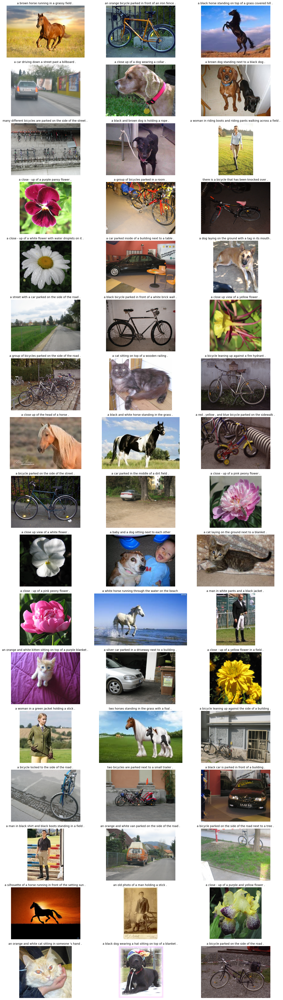

In [15]:
# Exploring the first 50 images generated captions

fig, axs = plt.subplots(17, 3, figsize=(15, 50))
# Loop over the first 50 rows of the DataFrame
for i, row in df.head(51).iterrows():
    path = destination_folder + '/' + row['file_name']
    caption = row['caption']
    # Load image
    img = Image.open(path)
    # Plot image
    ax = axs[i // 3, i % 3]  # Calculate subplot position
    ax.imshow(img)
    ax.axis('off')
    # Add caption
    ax.set_title(caption, fontsize=10)

plt.tight_layout()
plt.show()

# Export Dataset

In [18]:
df.to_csv('data.csv', index=False)
files.download('data.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>